In [14]:

!pip install kaggle pycocotools matplotlib pillow tqdm --quiet

import os, zipfile, random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pycocotools.coco import COCO


from google.colab import files
files.upload()

!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


DATASET = "awsaf49/coco-2017-dataset"
SAVE_DIR = "dataset"
ZIP_PATH = os.path.join(SAVE_DIR, "coco-2017-dataset.zip")
os.makedirs(SAVE_DIR, exist_ok=True)


!mkdir -p train2017 val2017 annotations


!wget -q http://images.cocodataset.org/annotations/annotations_trainval2017.zip
!unzip -qq annotations_trainval2017.zip -d annotations


!wget -q http://images.cocodataset.org/zips/val2017.zip
!unzip -qq val2017.zip -d val2017


!wget -q http://images.cocodataset.org/zips/train2017.zip
!mkdir -p train_subset
!unzip -qq train2017.zip "train2017/00*.jpg" "train2017/01*.jpg" "train2017/02*.jpg" -d train_subset


print("✅ Extracted ~20 000 COCO images + annotations successfully!")



Saving kaggle.json to kaggle.json
caution: filename not matched:  train2017/01*.jpg
caution: filename not matched:  train2017/02*.jpg
✅ Extracted ~20 000 COCO images + annotations successfully!



🔹 Loading COCO annotations...
loading annotations into memory...
Done (t=1.29s)
creating index...
index created!

🔹 Visualizing 50 image–mask pairs...


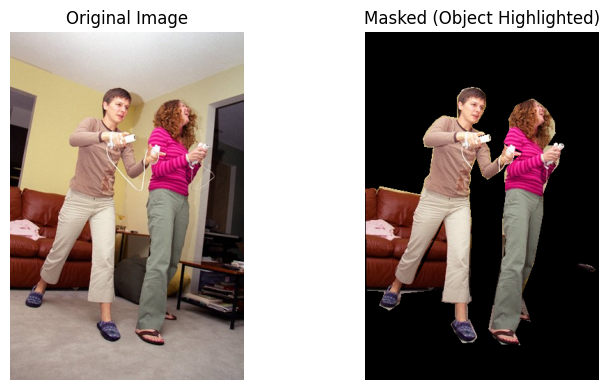

✅ Visualized 1/50


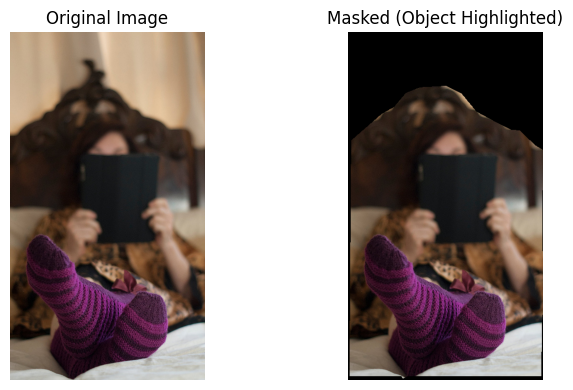

✅ Visualized 2/50


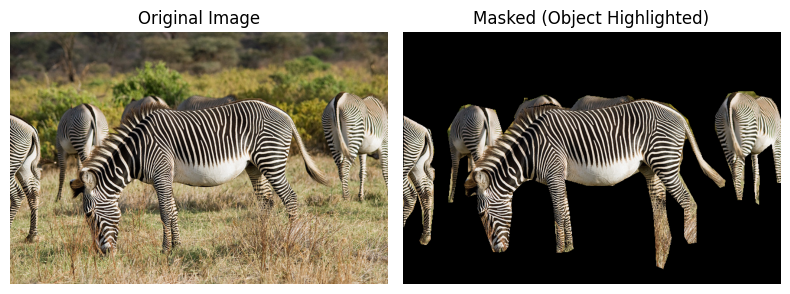

✅ Visualized 3/50


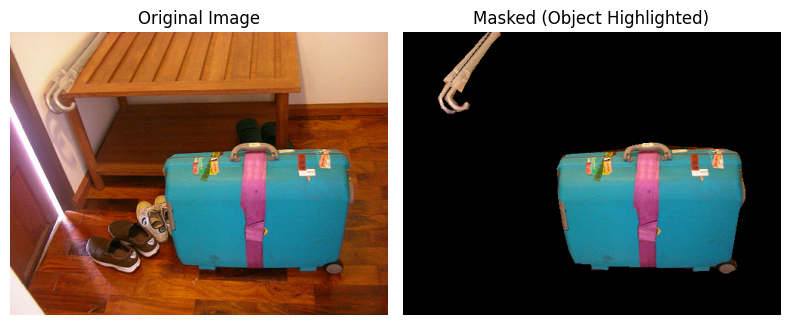

✅ Visualized 4/50


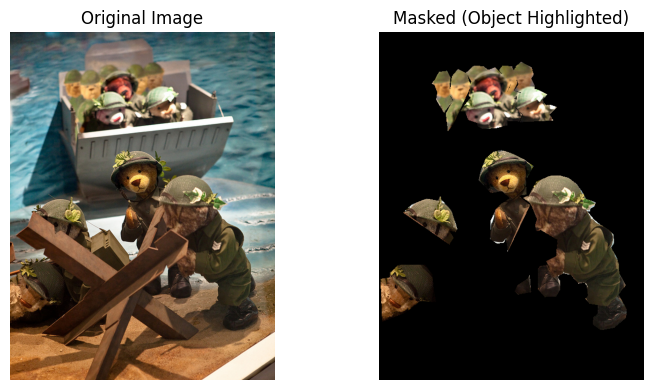

✅ Visualized 5/50


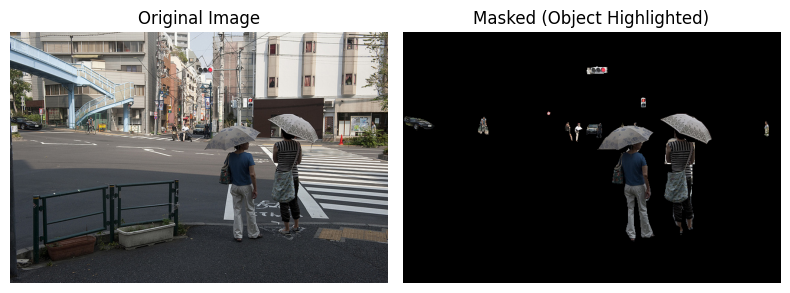

✅ Visualized 6/50


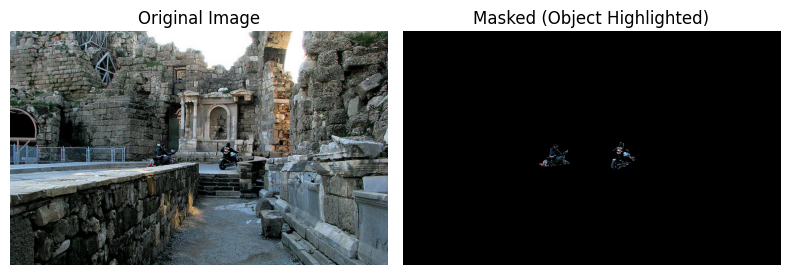

✅ Visualized 7/50


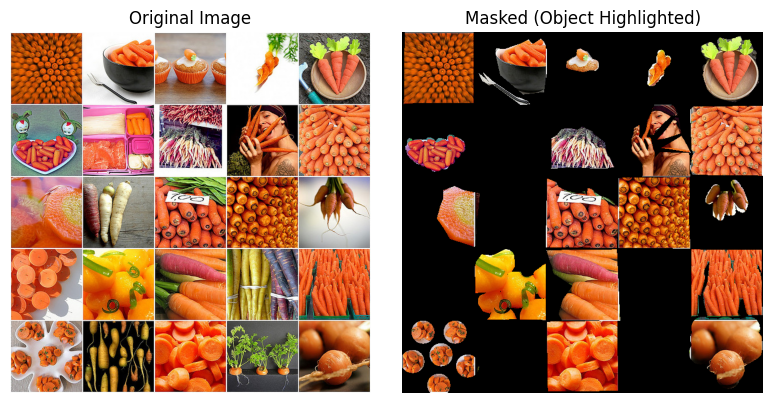

✅ Visualized 8/50


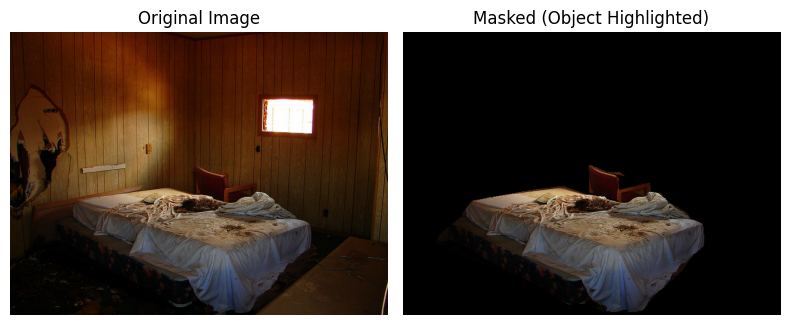

✅ Visualized 9/50


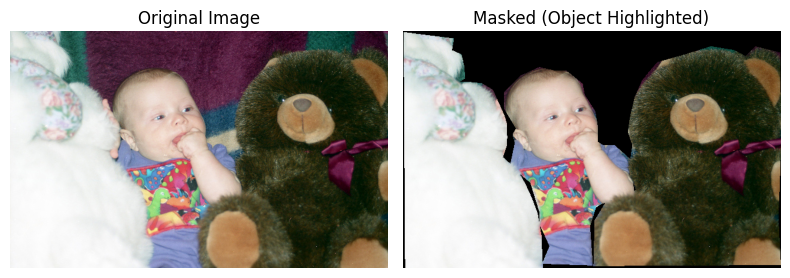

✅ Visualized 10/50


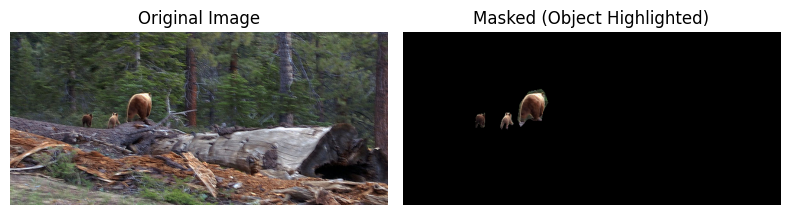

✅ Visualized 11/50


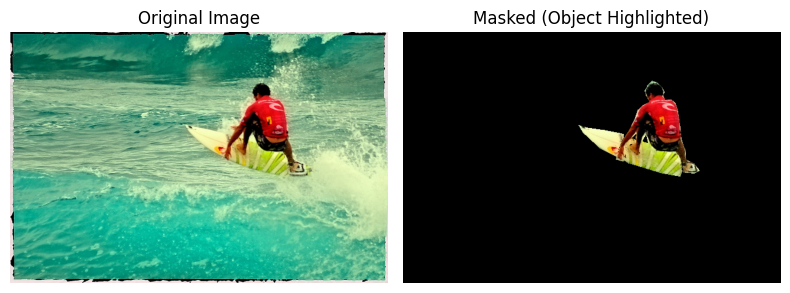

✅ Visualized 12/50


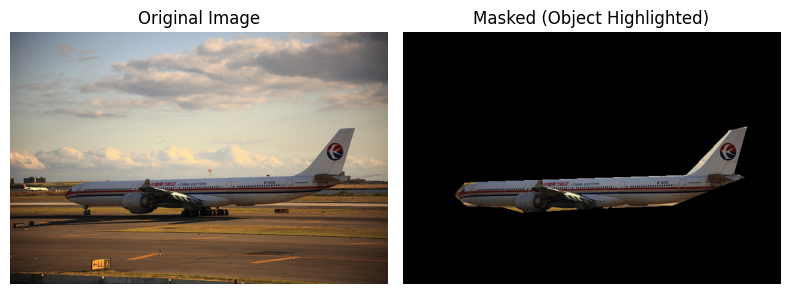

✅ Visualized 13/50


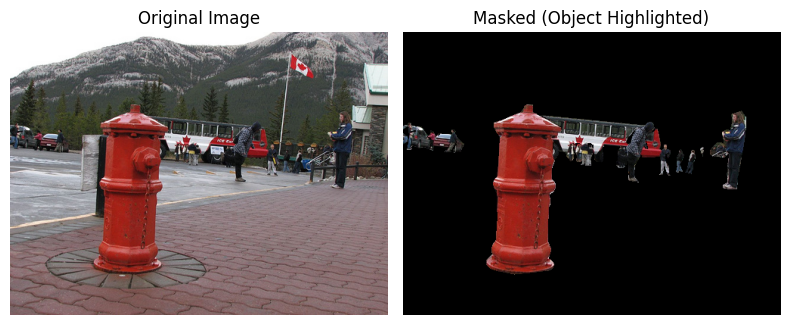

✅ Visualized 14/50


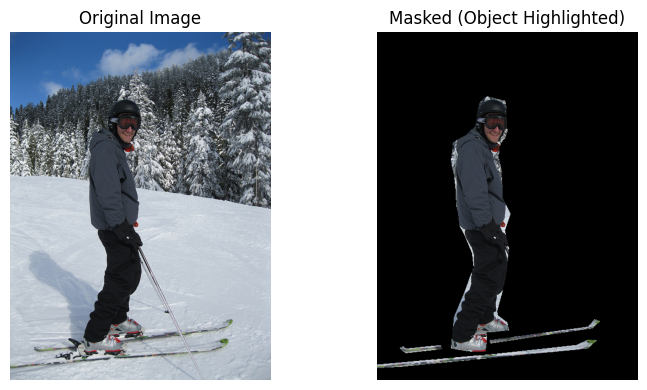

✅ Visualized 15/50


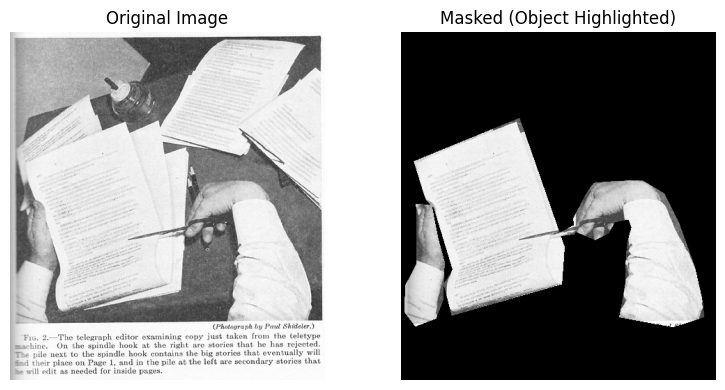

✅ Visualized 16/50


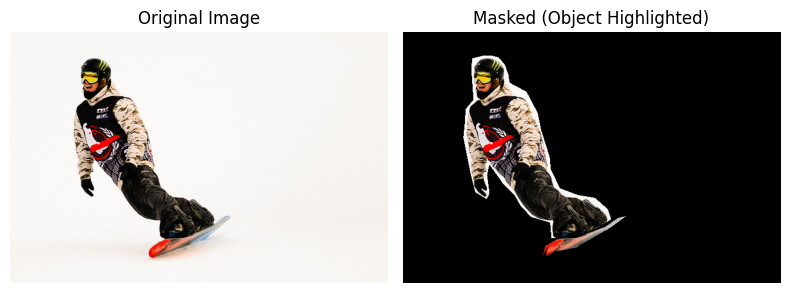

✅ Visualized 17/50


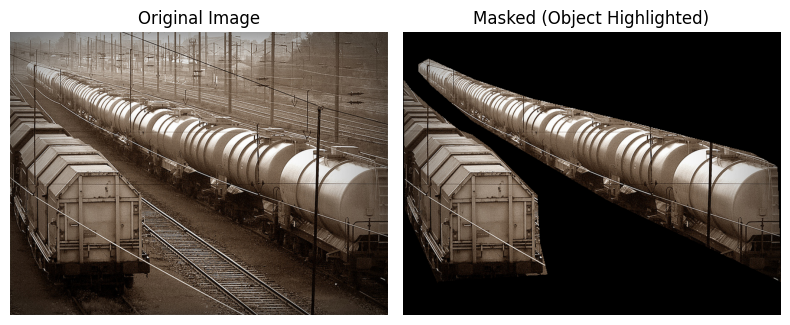

✅ Visualized 18/50


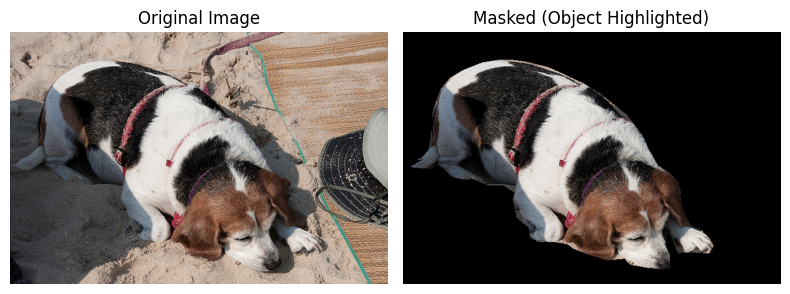

✅ Visualized 19/50


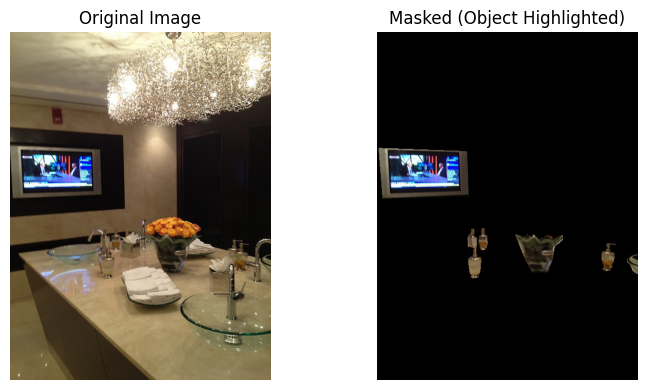

✅ Visualized 20/50


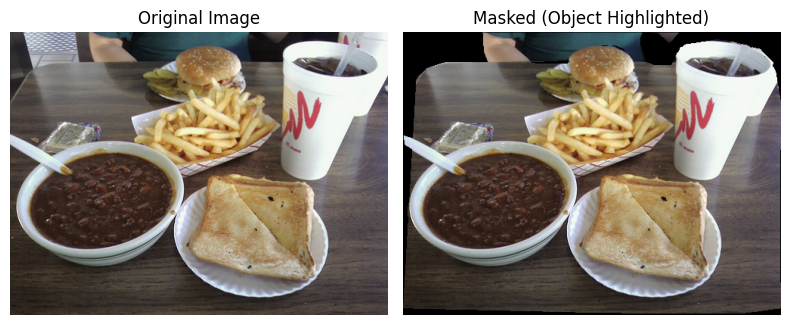

✅ Visualized 21/50


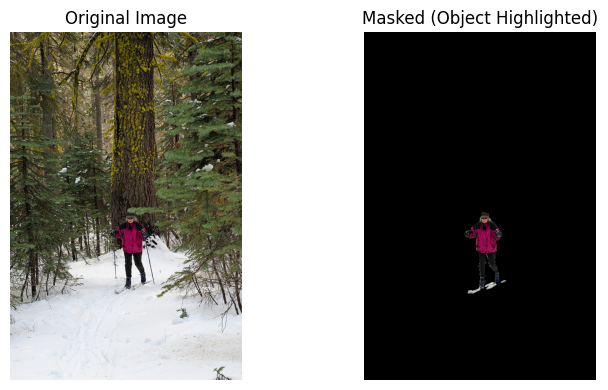

✅ Visualized 22/50


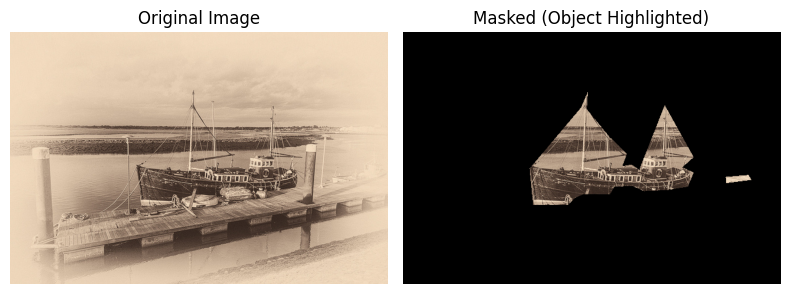

✅ Visualized 23/50


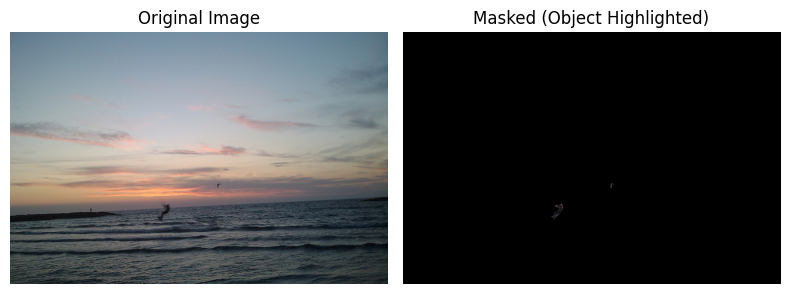

✅ Visualized 24/50


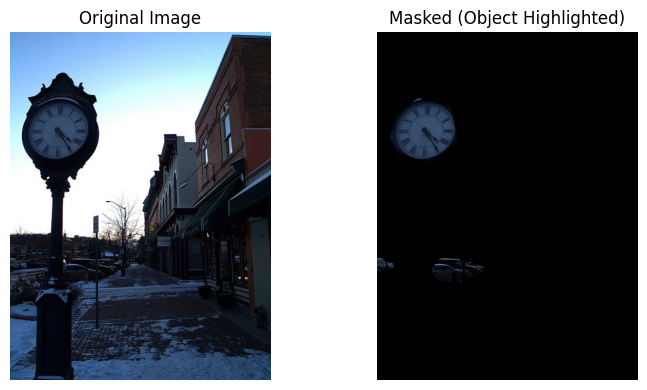

✅ Visualized 25/50


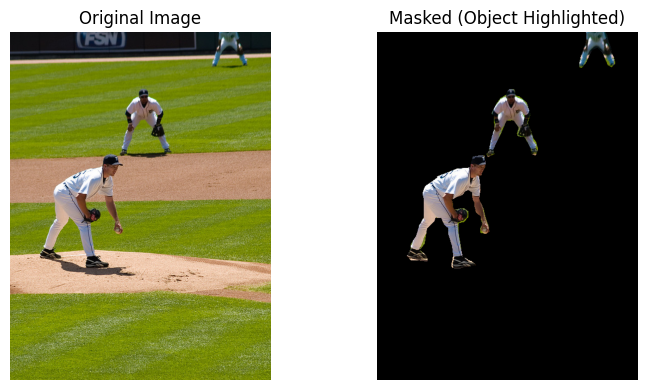

✅ Visualized 26/50


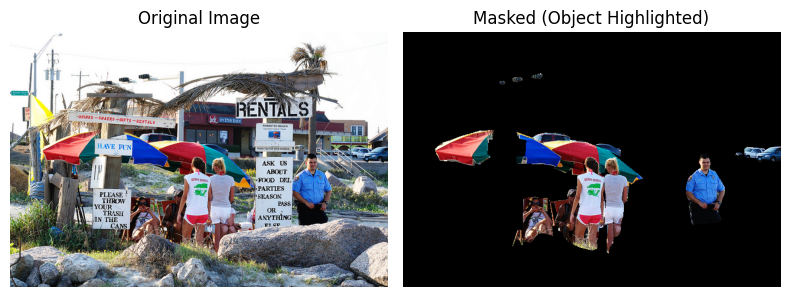

✅ Visualized 27/50


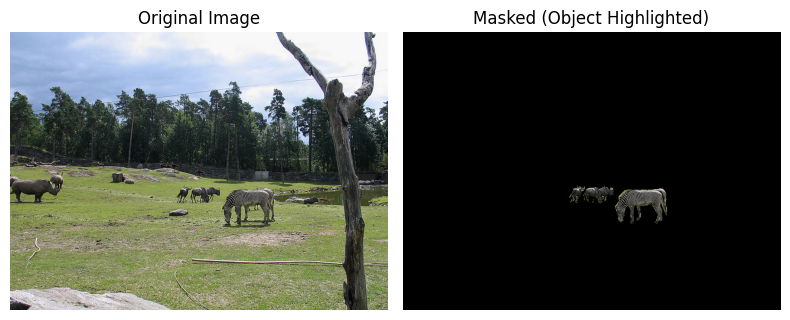

✅ Visualized 28/50


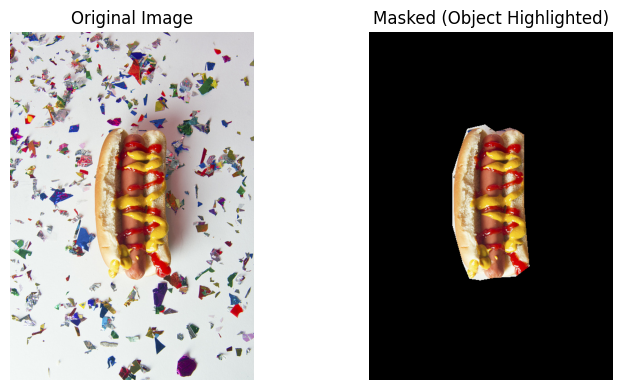

✅ Visualized 29/50


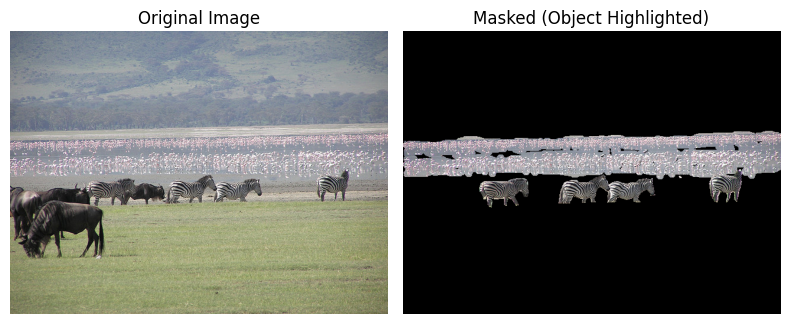

✅ Visualized 30/50


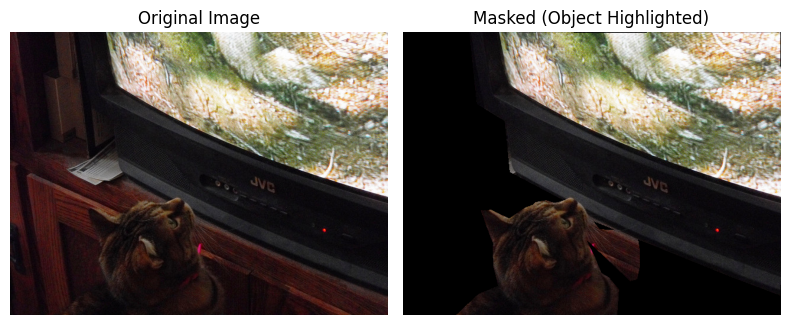

✅ Visualized 31/50


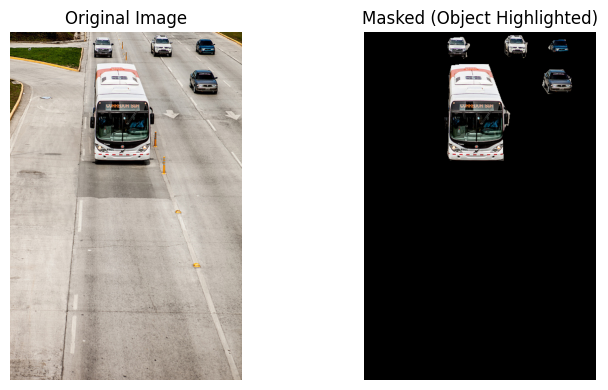

✅ Visualized 32/50


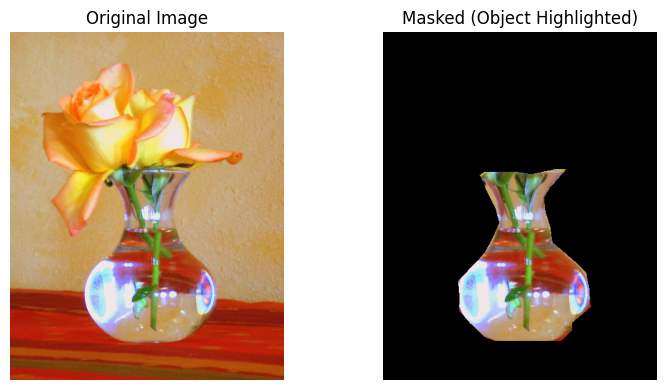

✅ Visualized 33/50


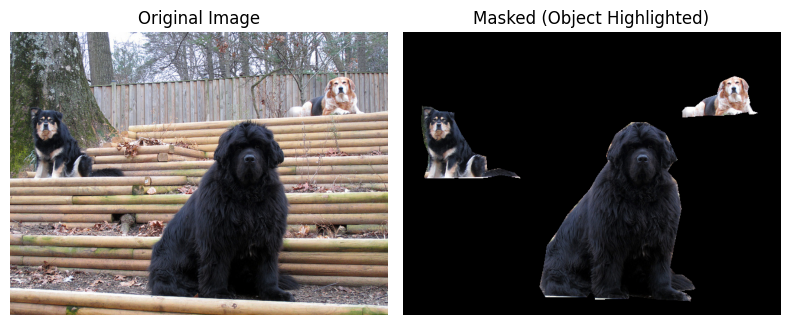

✅ Visualized 34/50


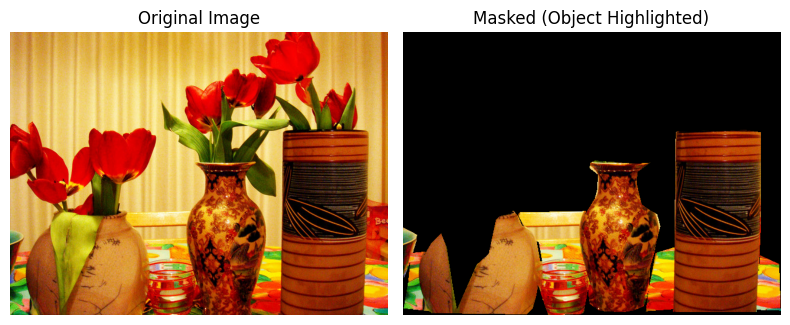

✅ Visualized 35/50


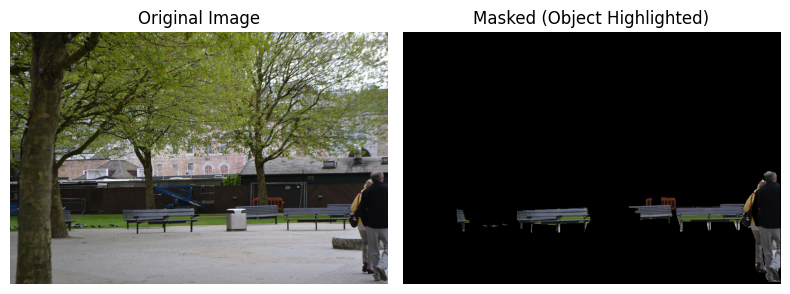

✅ Visualized 36/50


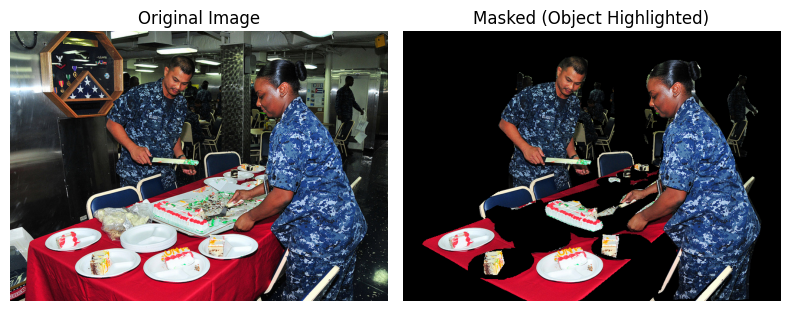

✅ Visualized 37/50


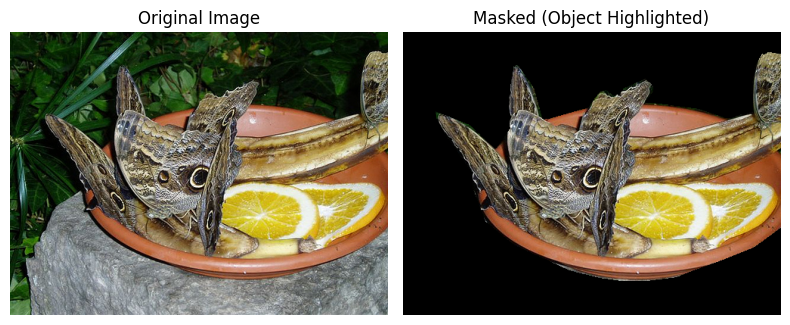

✅ Visualized 38/50


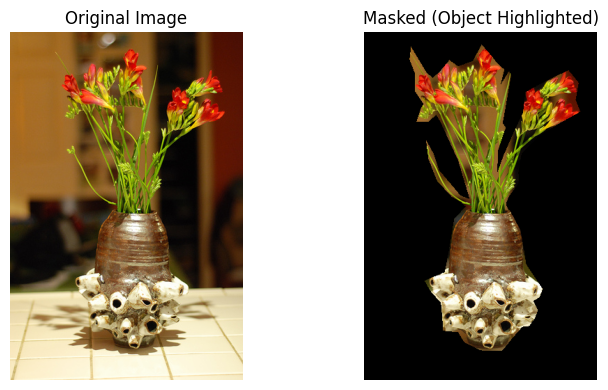

✅ Visualized 39/50


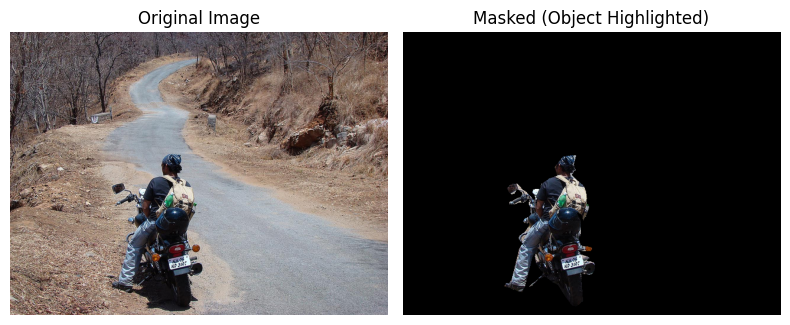

✅ Visualized 40/50


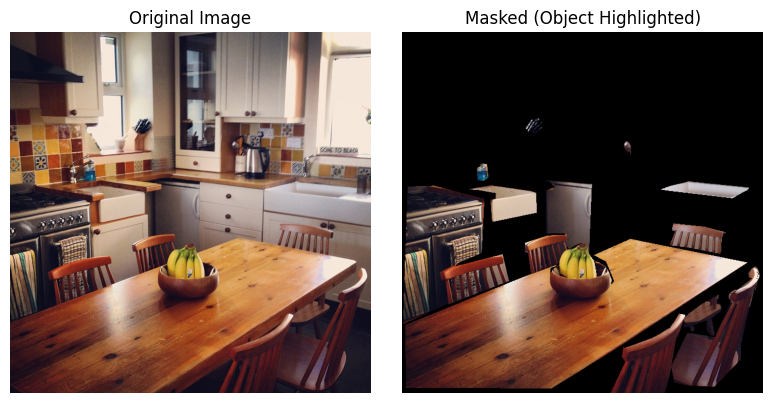

✅ Visualized 41/50


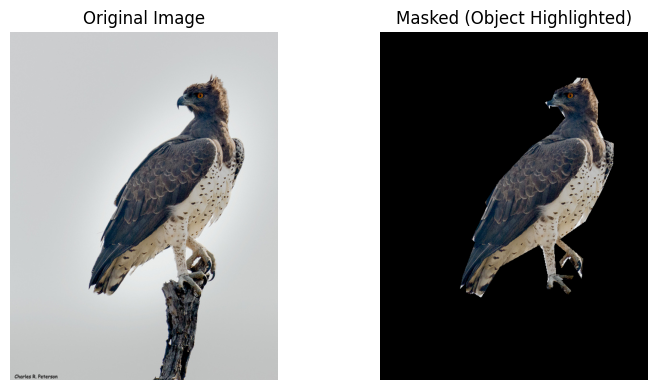

✅ Visualized 42/50


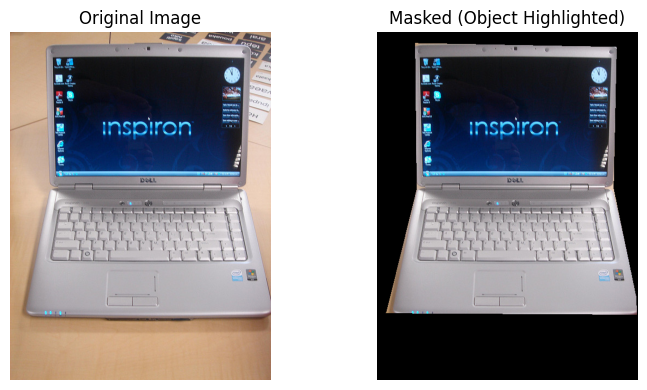

✅ Visualized 43/50


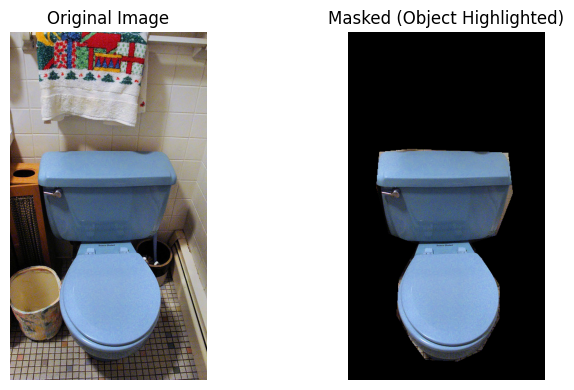

✅ Visualized 44/50


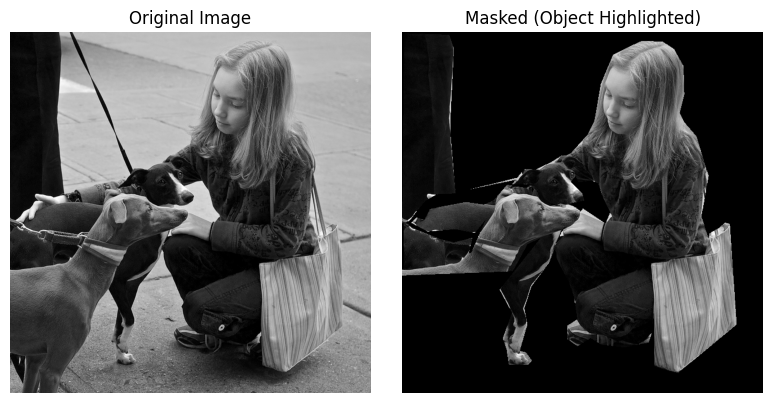

✅ Visualized 45/50


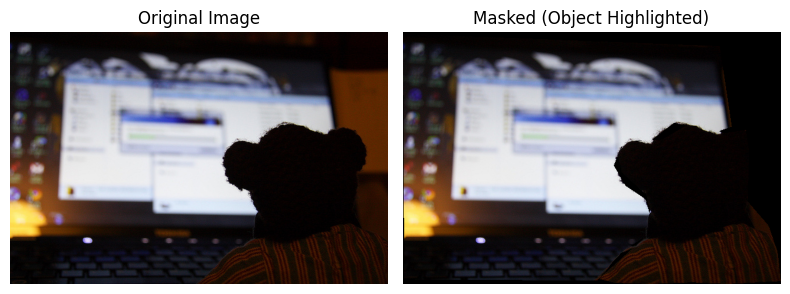

✅ Visualized 46/50


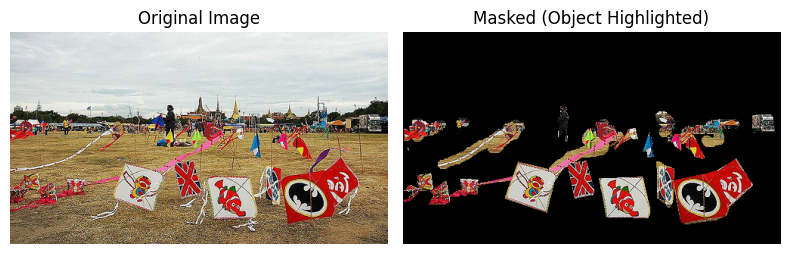

✅ Visualized 47/50


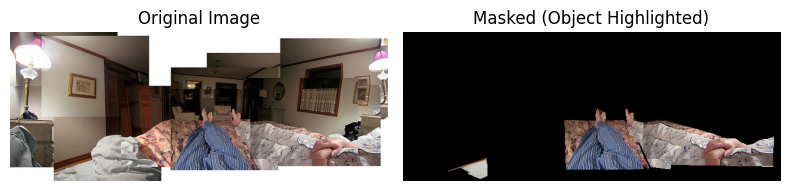

✅ Visualized 48/50


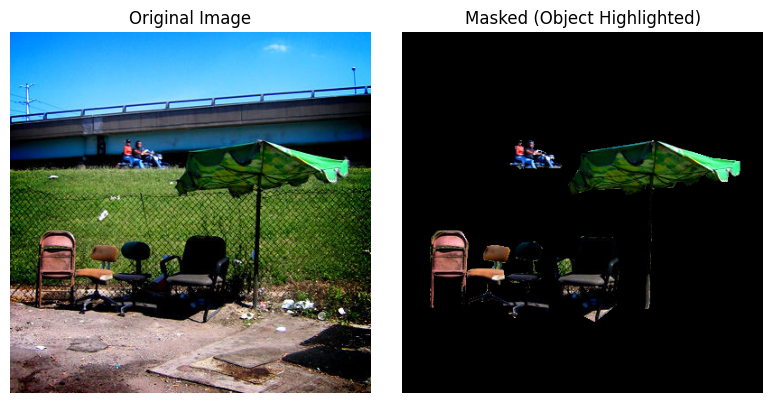

✅ Visualized 49/50


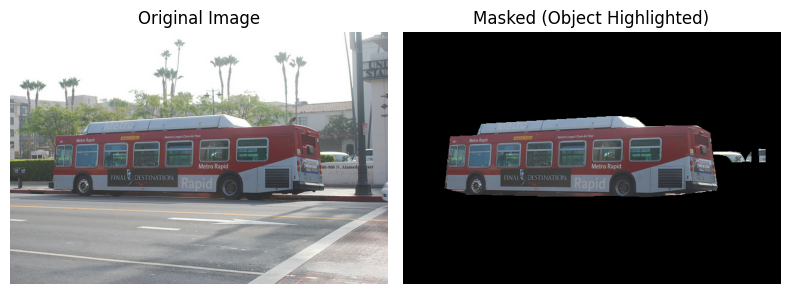

✅ Visualized 50/50

🎯 Milestone 1 (Week 1) successfully completed!


In [ ]:

#  Load and visualize 50 samples

ANNOTATION_FILE = "/content/annotations/annotations/instances_val2017.json"
IMAGE_DIR = "/content/val2017/val2017"
NUM_SAMPLES = 50

print("\n🔹 Loading COCO annotations...")
coco = COCO(ANNOTATION_FILE)

def visualize_images(coco, img_dir, num_samples=50):
    img_ids = coco.getImgIds()
    random.shuffle(img_ids)
    shown = 0

    for img_id in img_ids:
        if shown >= num_samples:
            break

        img_info = coco.loadImgs(img_id)[0]
        img_path = os.path.join(img_dir, img_info['file_name'])
        if not os.path.exists(img_path):
            continue

        ann_ids = coco.getAnnIds(imgIds=img_info['id'])
        anns = coco.loadAnns(ann_ids)
        if not anns:
            continue

        # Load original image
        img = np.array(Image.open(img_path).convert("RGB"))

        # Build combined mask (object regions)
        mask = np.zeros((img.shape[0], img.shape[1]), dtype=np.uint8)
        for ann in anns:
            mask = np.maximum(mask, coco.annToMask(ann))

        # Create masked image: keep only object, blacken background
        masked_img = img.copy()
        masked_img[mask == 0] = 0

        # Display side by side
        fig, ax = plt.subplots(1, 2, figsize=(8, 4))
        ax[0].imshow(img)
        ax[0].set_title("Original Image")
        ax[0].axis("off")

        ax[1].imshow(masked_img)
        ax[1].set_title("Masked (Object Highlighted)")
        ax[1].axis("off")

        plt.tight_layout()
        plt.show()

        shown += 1
        print(f"✅ Visualized {shown}/{num_samples}")


print("\n🔹 Visualizing 50 image–mask pairs...")
visualize_images(coco, IMAGE_DIR, NUM_SAMPLES)
print("\n🎯 Milestone 1 (Week 1) successfully completed!")